In [259]:
import IPython.core.display as di

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

In [57]:
import pandas as pd
import numpy as np

import glob, os

import statsmodels.formula.api as smf
import sys
from natsort import natsorted

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import ephys_functions as ephys

import importlib as imp
imp.reload(ephys);

In [2]:
#artifacts
first_art_begin = 0.081 
first_art_end = 0.0845 
second_art_begin = 0.131
second_art_end = 0.134

#time points of traces for analysis
end_cap = 0.02
first_stim_begin = 0.08
first_stim_end = 0.125
second_stim_begin = 0.136
second_stim_end = 0.175

#time points for finding NMDA decay time
end_tau_trace = 0.58
begin_NMDA_tau = 0.115
end_NMDA_tau = 0.5

#for finding tau of capacitance traces
begin_cap_curve = 0.00565
end_cap_curve = 0.011
begin_cap_baseline = 0.010
tau_threshold = 0.001

In [244]:
#load all excel and csv files
excels = glob.glob('/Volumes/lab_data_2/*Cell*')
files = glob.glob('/Volumes/lab_data_2/*.csv')

In [245]:
#grab names for files
file_names = []
for name in files:
    name = name[20:30]
    file_names.append(name)

excel_names = []
for name in excels:
    name = name[20:]
    name = name.strip('.xlsx')
    excel_names.append(name)

In [6]:
dict_files = {}
for k, v in zip(file_names, files):
    dict_files[k] = pd.read_csv(v, index_col = 0)

In [246]:
dict_excels = {}
for k, v in zip(excel_names, excels):
    dict_excels[k] = pd.read_excel(v)

In [247]:
dates = [key for key, value in dict_files.items()]
dict_filtered = {}

for date in dates:
    info = {}
    for k, v in dict_excels.items():
        if date in k:
            info[k] = v
    
    for name, i in info.items():
        all_waves = ephys.select_waves(dict_files[date], i)
        cap_waves = all_waves[:end_cap]

        #calculate peak of capacitance wave of minimal response
        min_ampa, min_nmda = ephys.find_cap_peak(cap_waves, wave_info = i)

        #all capacitance waves
        cap_A, cap_N = ephys.split_cols_AN(cap_waves)

        #filter ampa and nmda separately then recombine
        filtered_A = ephys.filter_by_cap(cap_A, min_ampa)
        filtered_N = ephys.filter_by_cap(cap_N, min_nmda)
        filtered = all_waves[ephys.recombine_AN(filtered_A, filtered_N)]
        dict_filtered[name] = filtered

In [187]:
#broken?
excels_2 = glob.glob('/Volumes/lab_data_2/Broken/*Cell*')

excel_names_2 = []
for name in excels_2:
    name = name[27:]
    name = name.strip('.xlsx')
    excel_names_2.append(name)

In [191]:
dict_excels_2 = {}
for k, v in zip(excel_names_2, excels_2):
    dict_excels_2[k] = pd.read_excel(v)

In [242]:
dates = [key for key, value in dict_files.items()]
dict_filtered_2 = {}

for date in dates:
    info = {}
    for k, v in dict_excels_2.items():
        if date in k:
            info[k] = v
    
    for name, i in info.items():
        all_waves = ephys.select_waves(dict_files[date], i)
        cap_waves = all_waves[:end_cap]

        #calculate peak of capacitance wave of minimal response
        min_ampa, min_nmda = ephys.find_cap_peak(cap_waves, wave_info = i)

        #all capacitance waves
        cap_A, cap_N = ephys.split_cols_AN(cap_waves)

        #filter ampa and nmda separately then recombine
        filtered_A = ephys.filter_by_cap(cap_A, min_ampa)
        filtered_N = ephys.filter_by_cap(cap_N, min_nmda)
        filtered = all_waves[ephys.recombine_AN(filtered_A, filtered_N)]
        dict_filtered_2[name] = filtered

In [249]:
dict_to_analyze = {**dict_filtered, **dict_filtered_2}

In [250]:
pd.options.mode.chained_assignment = None

to_analyze = {}
for key, value in dict_to_analyze.items():
    to_analyze[key] = ephys.process_waves(value)

In [253]:
first_stim = {}
second_stim = {}
both_stim = {}
for key, value in to_analyze.items():
    first, second, both = ephys.divide_into_sections(value)
    first_stim[key] = first
    second_stim[key] = second
    both_stim[key] = both

In [263]:
cap_waves = {}
for key, value in dict_to_analyze.items():
    if key >= '2017.03.15':
        cap = ephys.find_cap_wave(value)
        cap_waves[key] = cap

In [260]:
_ = sns.axes_style('darkgrid');
_ = sns.set_palette('husl');

#for key, value in both_stim.items():
#    fig, ax = plt.subplots();
#    fig.set_size_inches(11.7, 8.27);
#    _ = plt.plot(value, linewidth = 0.5);
#    _ = plt.xlabel('seconds');
#    _ = plt.ylabel('pA');
#    _ = plt.title(key);

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


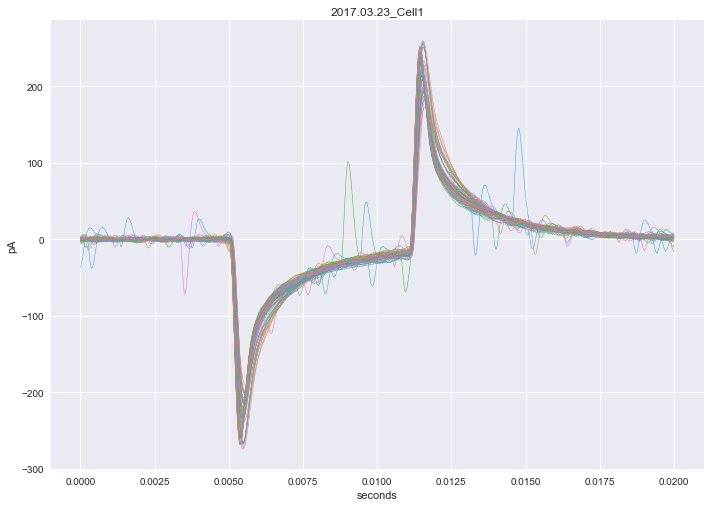

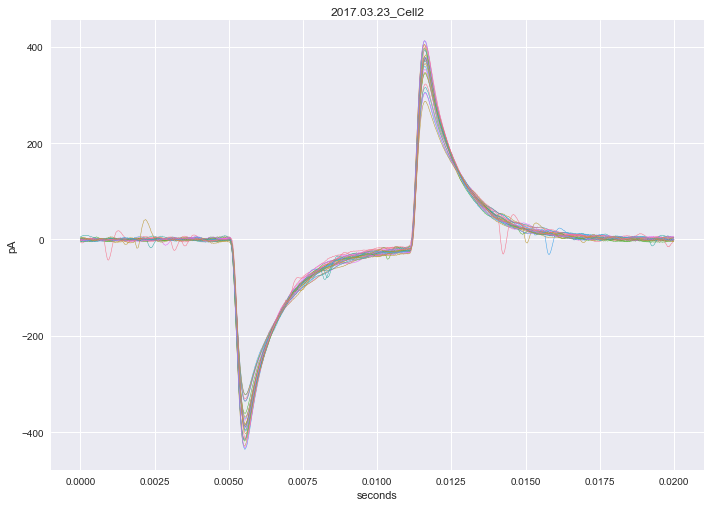

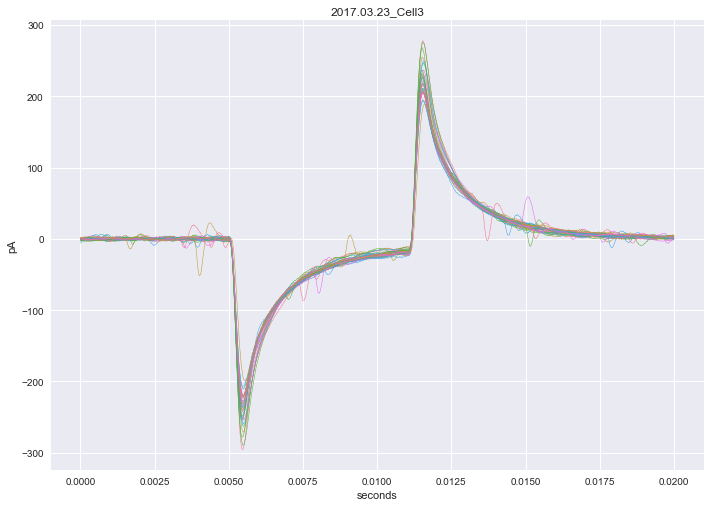

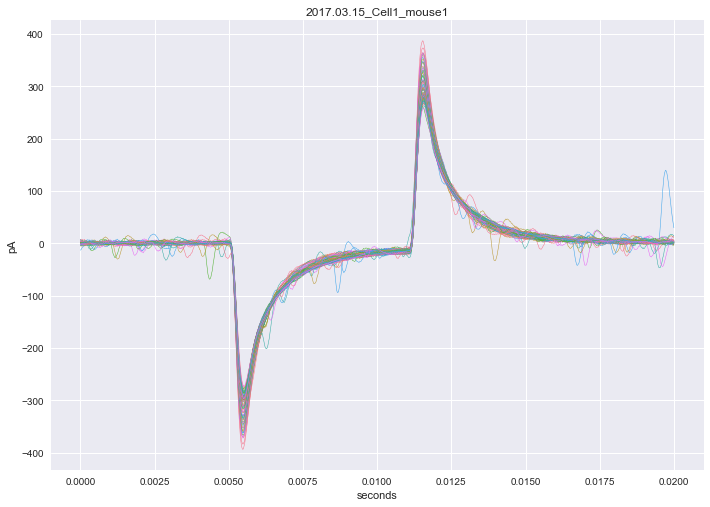

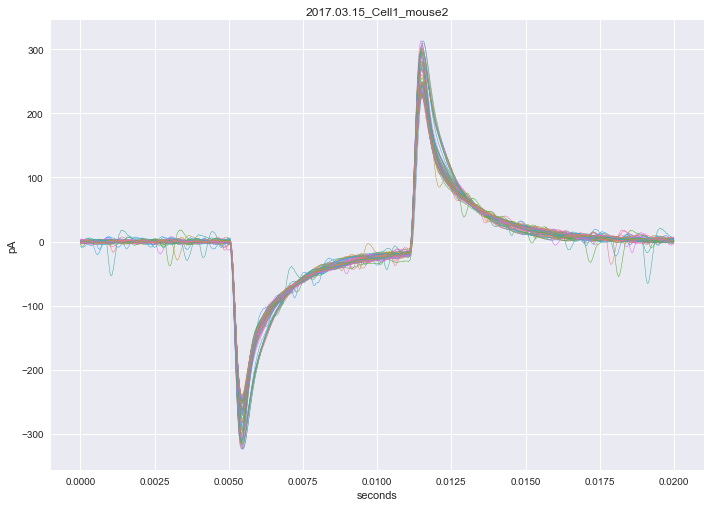

...

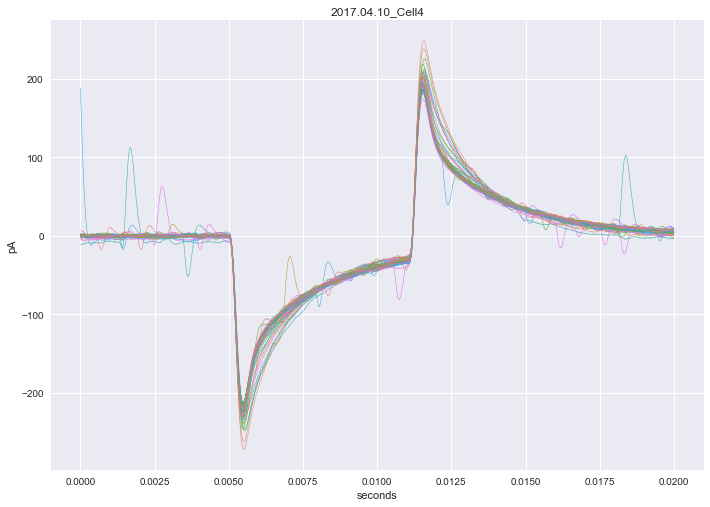

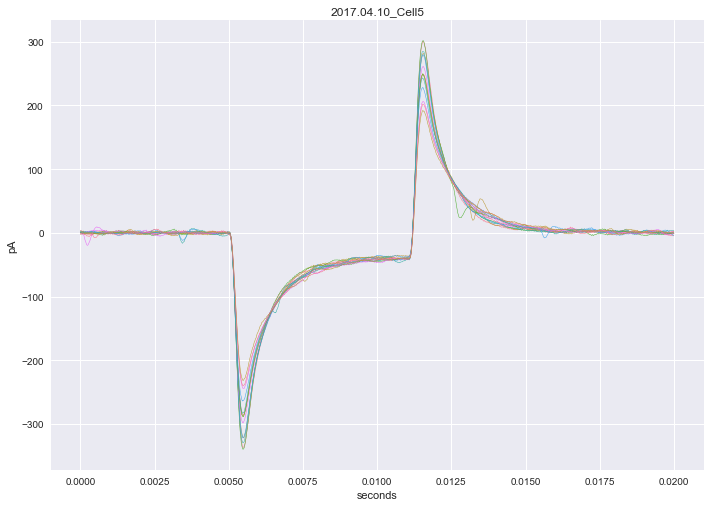

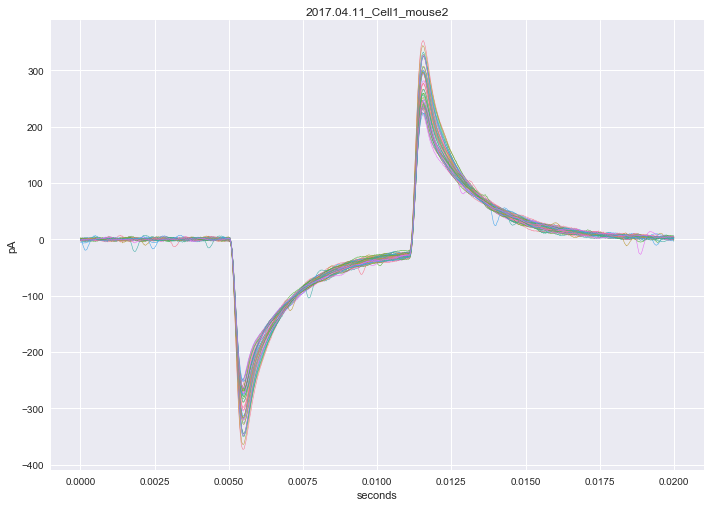

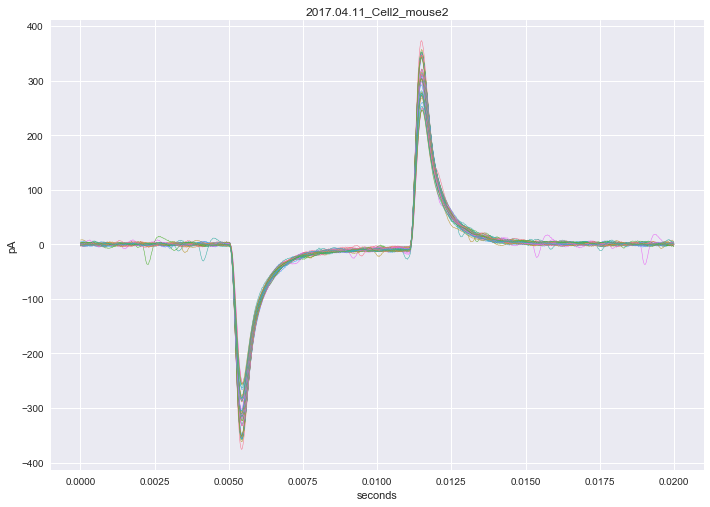

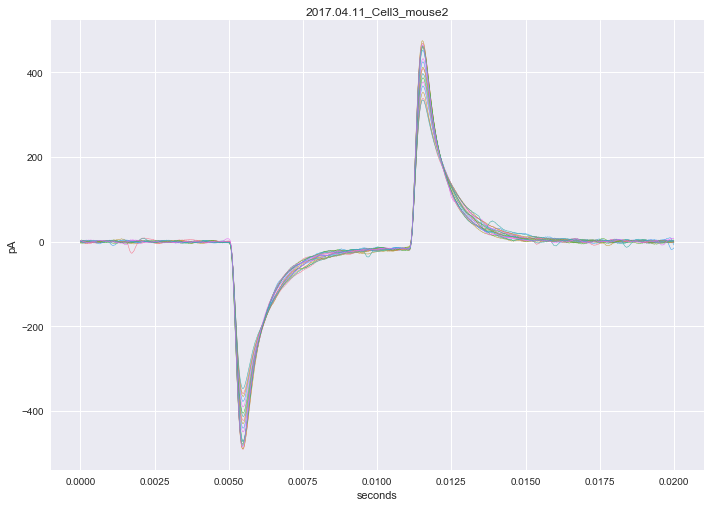

In [264]:
_ = sns.axes_style('darkgrid');
_ = sns.set_palette('husl');

for key, value in cap_waves.items():
    fig, ax = plt.subplots();
    fig.set_size_inches(11.7, 8.27);
    _ = plt.plot(value, linewidth = 0.5);
    _ = plt.xlabel('seconds');
    _ = plt.ylabel('pA');
    _ = plt.title(key);

In [257]:
to_review = {}
for key, value in both_stim.items():
    if key >= '2017.03.15':
        to_review[key] = value

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


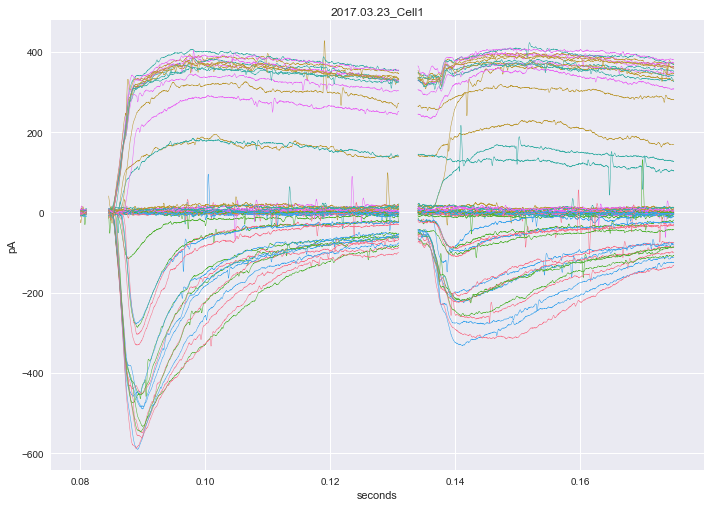

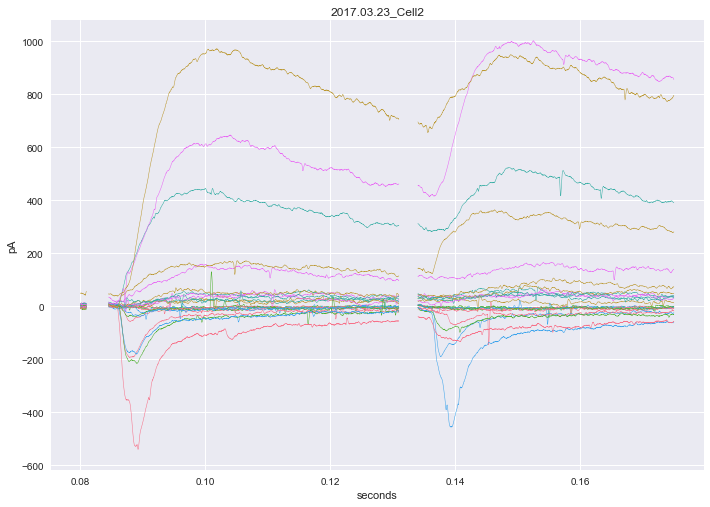

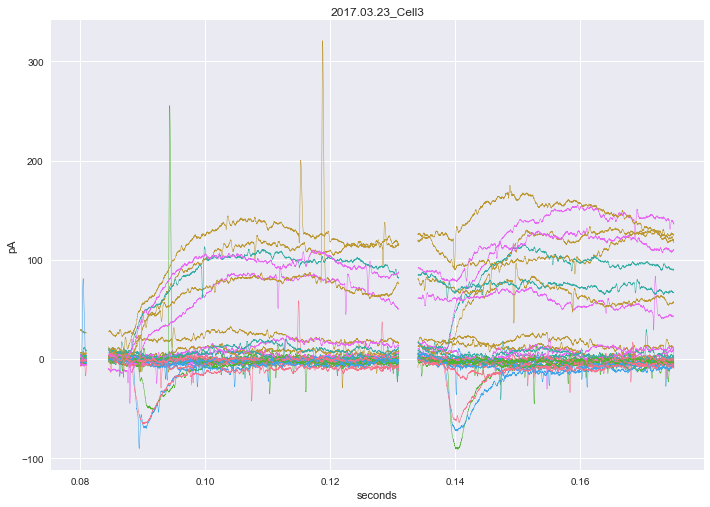

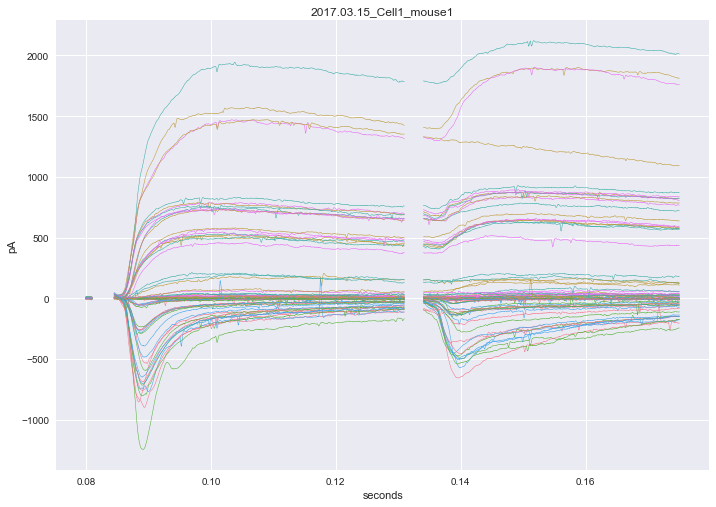

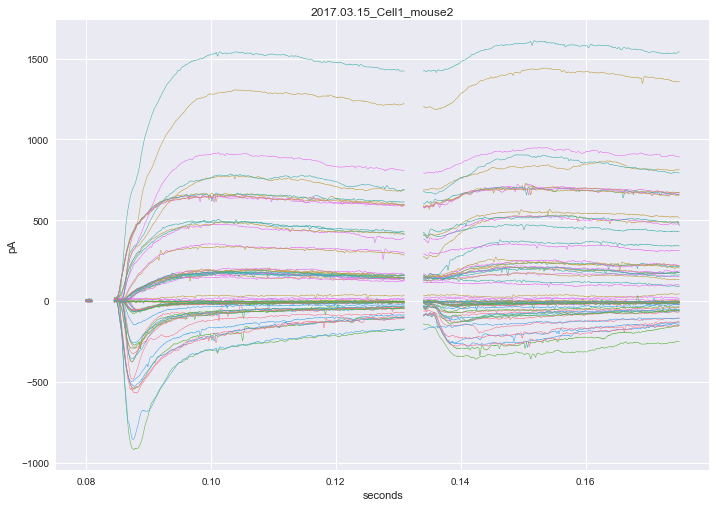

...

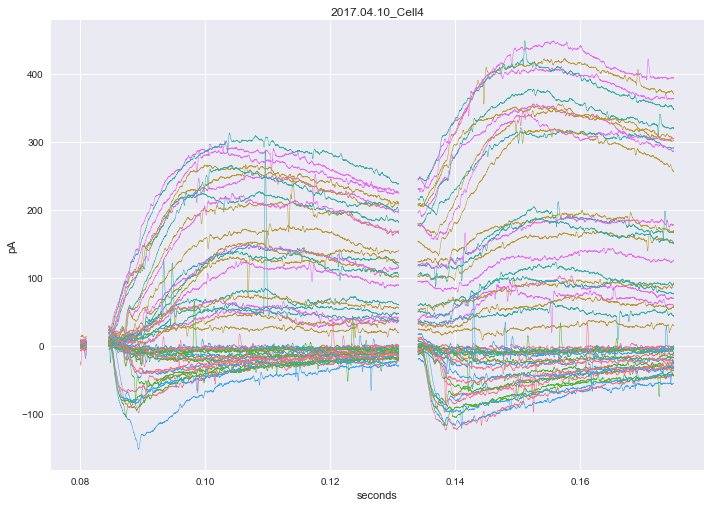

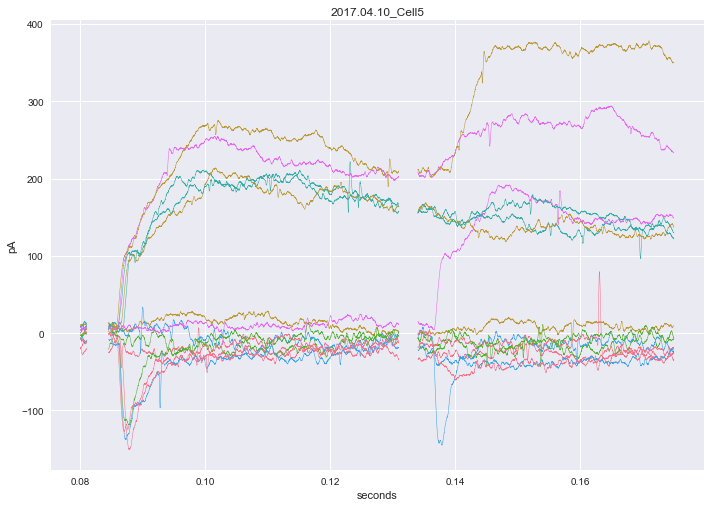

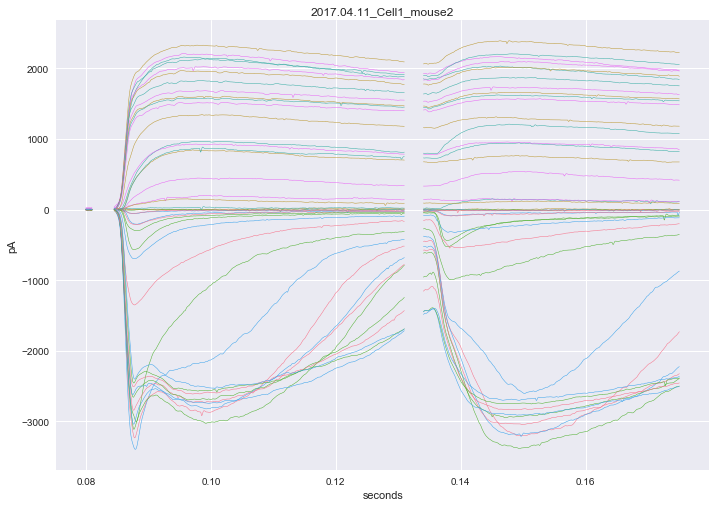

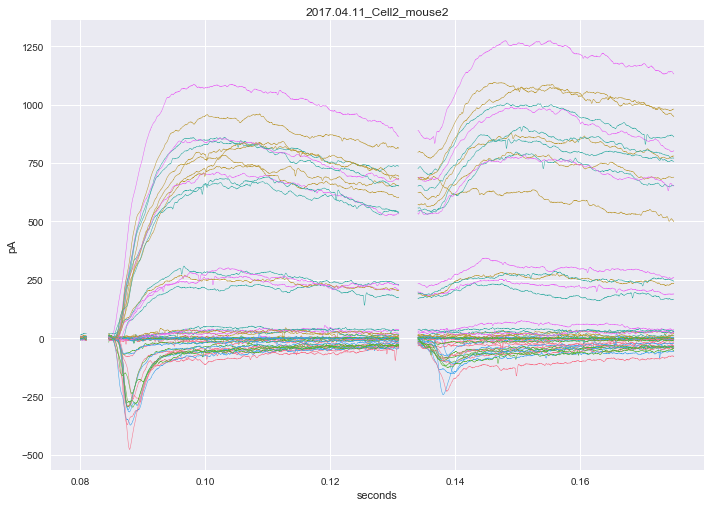

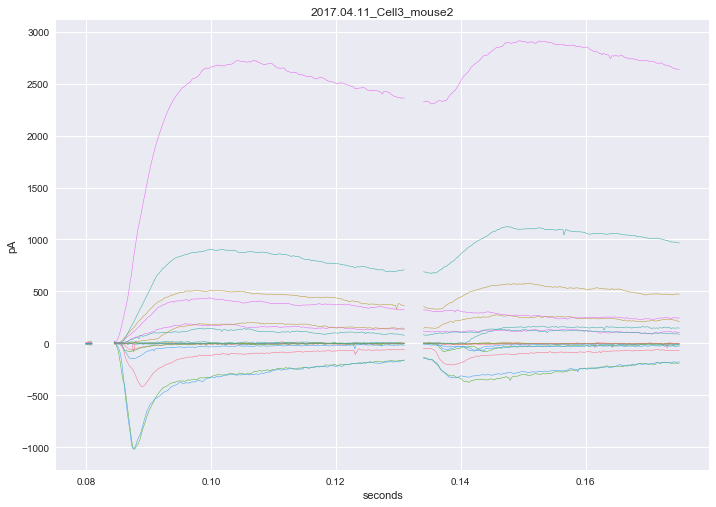

In [258]:
_ = sns.axes_style('darkgrid');
_ = sns.set_palette('husl');

for key, value in to_review.items():
    fig, ax = plt.subplots();
    fig.set_size_inches(11.7, 8.27);
    _ = plt.plot(value, linewidth = 0.5);
    _ = plt.xlabel('seconds');
    _ = plt.ylabel('pA');
    _ = plt.title(key);